In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_selection import VarianceThreshold
from sklearn.cluster import KMeans
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
import gensim
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

import data_exploration as file_de
import data_pre_processing as file_dpp

C:\Users\ericw\anaconda3\lib\site-packages\gensim\similarities\__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ericw\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\ericw\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [2]:
df_list = file_dpp.main_proc()
df_list[-1]

(16593, 2)
(16713, 2)
(5516, 2)


,name,review,game,platform,score,date,Name,Platform,Year_of_Release,Genre,...,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,LEVEL (Czech Republic),"Portal 2 is a masterpiece, a work of art that ...",portal 2,PC,100.0,"May 25, 2011",portal 2,PC,2011.0,Shooter,...,0.32,0.0,0.1,0.76,95.0,52.0,8.8,5999.0,Valve Software,E10+
1,GameCritics,So do we need Portal 2? Do I need it? Maybe no...,portal 2,PC,100.0,"May 8, 2011",portal 2,PC,2011.0,Shooter,...,0.32,0.0,0.1,0.76,95.0,52.0,8.8,5999.0,Valve Software,E10+
2,PC Games (Russia),Portal 2 exceeds every expectation. It has a s...,portal 2,PC,100.0,"May 6, 2011",portal 2,PC,2011.0,Shooter,...,0.32,0.0,0.1,0.76,95.0,52.0,8.8,5999.0,Valve Software,E10+
3,Adventure Gamers,"Like its predecessor, Portal 2 is not an adven...",portal 2,PC,100.0,"Apr 29, 2011",portal 2,PC,2011.0,Shooter,...,0.32,0.0,0.1,0.76,95.0,52.0,8.8,5999.0,Valve Software,E10+
4,Armchair Empire,"Pile on the ""Oh, yes!"" moments of solving some...",portal 2,PC,100.0,"Apr 28, 2011",portal 2,PC,2011.0,Shooter,...,0.32,0.0,0.1,0.76,95.0,52.0,8.8,5999.0,Valve Software,E10+
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32774,XboxAddict,Despite the lackluster quality with some of it...,ride 2,XOne,70.0,"Mar 7, 2017",ride 2,XOne,2016.0,Racing,...,0.01,0.0,0.0,0.01,NaN,NaN,8.2,6.0,Milestone S.r.l,E
32775,ICXM,Ride 2 is a huge improvement over the original...,ride 2,XOne,70.0,"Feb 18, 2017",ride 2,XOne,2016.0,Racing,...,0.01,0.0,0.0,0.01,NaN,NaN,8.2,6.0,Milestone S.r.l,E
32776,Worth Playing,Ride 2 is certainly an improvement over the or...,ride 2,XOne,65.0,"Mar 9, 2017",ride 2,XOne,2016.0,Racing,...,0.01,0.0,0.0,0.01,NaN,NaN,8.2,6.0,Milestone S.r.l,E
32777,TrueAchievements,"Despite the addition of more bikes and tracks,...",ride 2,XOne,60.0,"Oct 13, 2016",ride 2,XOne,2016.0,Racing,...,0.01,0.0,0.0,0.01,NaN,NaN,8.2,6.0,Milestone S.r.l,E


In [3]:
main_df = df_list[-1]
main_df['review_tokens'] = main_df['review'].str.lower()
main_df['review_tokens'] = main_df['review_tokens'].apply(word_tokenize)

LabeledSentence1 = gensim.models.doc2vec.TaggedDocument
all_content_train = []
j=0
for em in main_df['review_tokens'].values:
    all_content_train.append(LabeledSentence1(em,[j]))
    j+=1
print('Number of texts processed: ', j)

Number of texts processed:  32779


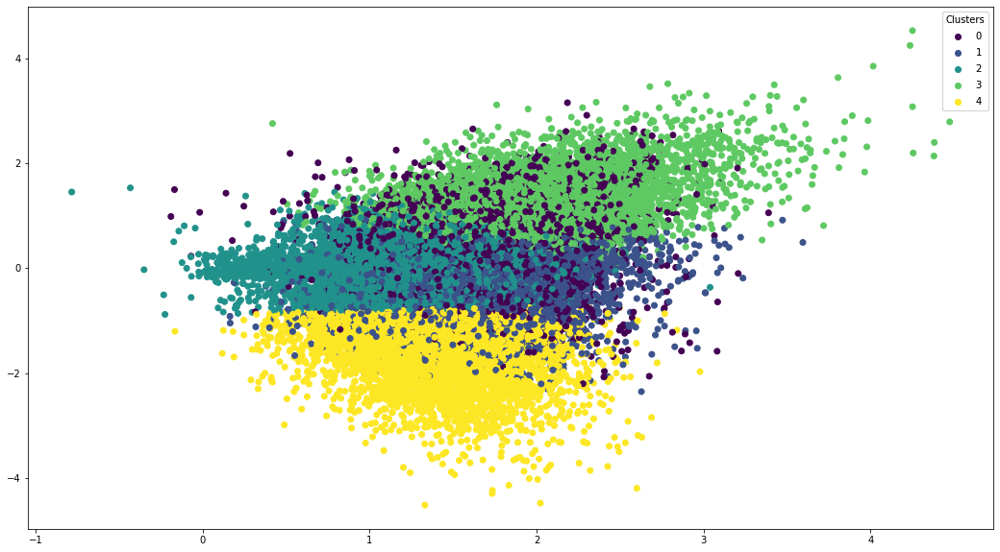

In [4]:
d2v_model = Doc2Vec(all_content_train, 
vector_size=3, # 100~300
window=4, # this is okay but changing it may not affect it
min_count=1, # Could bump this up to even 100 to see what happens
# Pick max_vocab_size over min_count, as they do the same things
# Visualize the loss, if the curve of the loss has yet to reach a plateau shape, then increase the number of epochs

workers=4)
d2v_model.train(all_content_train, total_examples=d2v_model.corpus_count, epochs=100)

# Observe the output, plot the loss function, see if the loss jumps around, the the alpha (learning rate) is too high, also tweak min_alpha 

x_train = d2v_model.dv[0].reshape(1,-1)
for i in range(1,j):
    x_train = np.append(x_train, d2v_model.dv[i].reshape(1,-1),axis=0)

kmeans = KMeans(n_clusters=5, random_state=12345).fit(x_train)
kmeans_labels = kmeans.labels_

svd = TruncatedSVD(n_components=2, n_iter=10, random_state=12345)
transformed_unigrams = svd.fit_transform(x_train)

#Visualize the clusters
x = transformed_unigrams[:,0]
y = transformed_unigrams[:,1]
#colors = cm.rainbow(np.linspace(0, 1, y.shape[0]))
fig, ax = plt.subplots(figsize=(18,10))
scatter = ax.scatter(x, y, c=kmeans_labels)
legend1 = ax.legend(*scatter.legend_elements(), loc="upper right", title="Clusters")
ax.add_artist(legend1)
plt.show()

Cluster 0


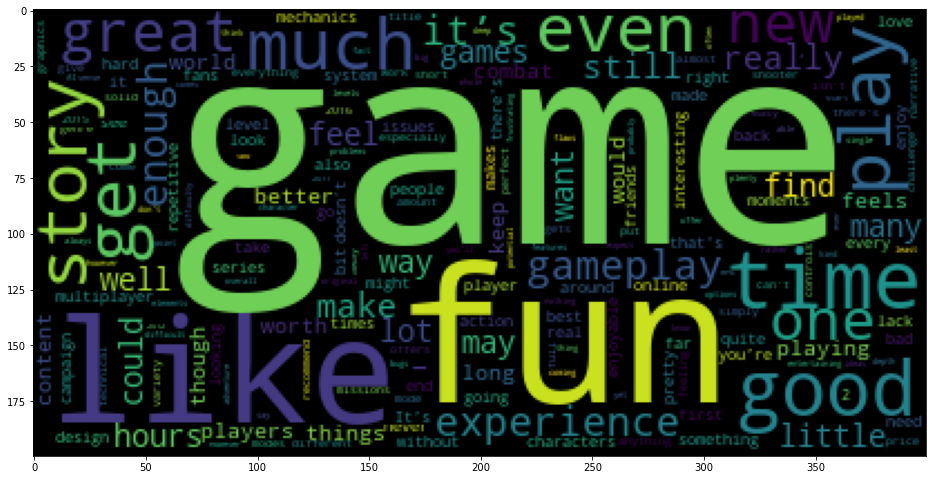

Cluster 1


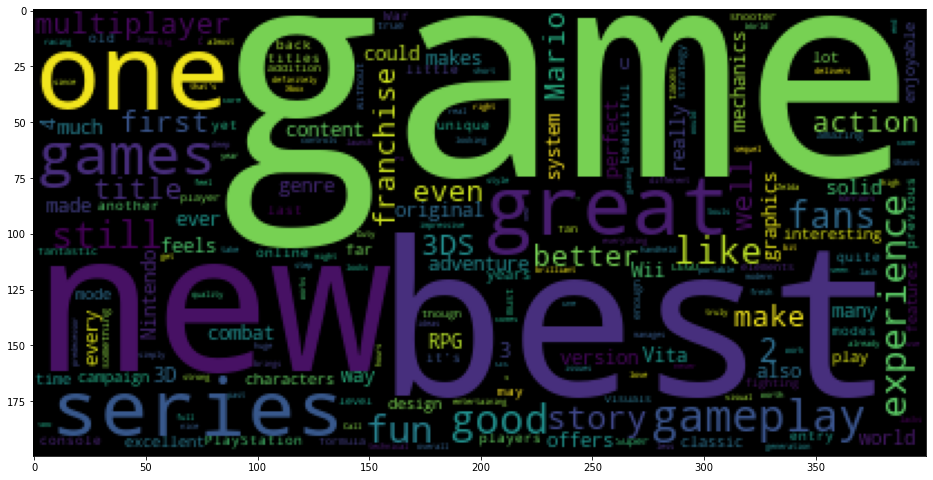

Cluster 2


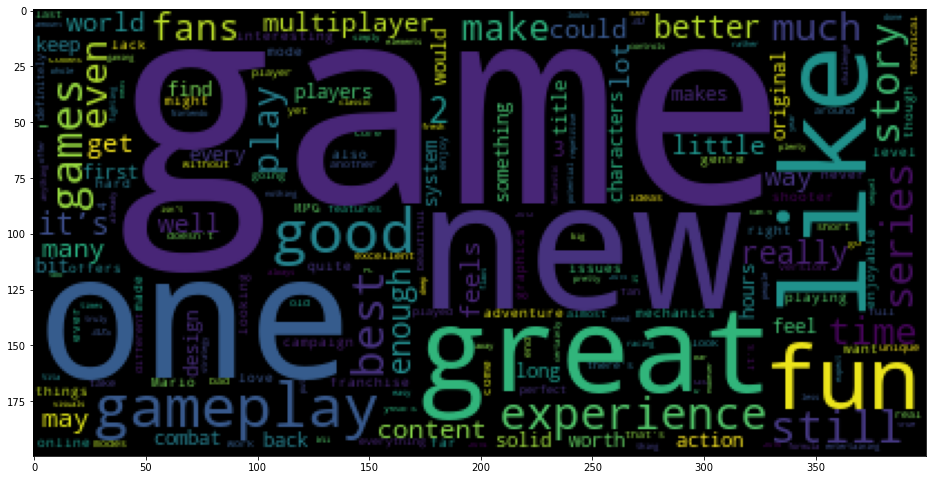

Cluster 3


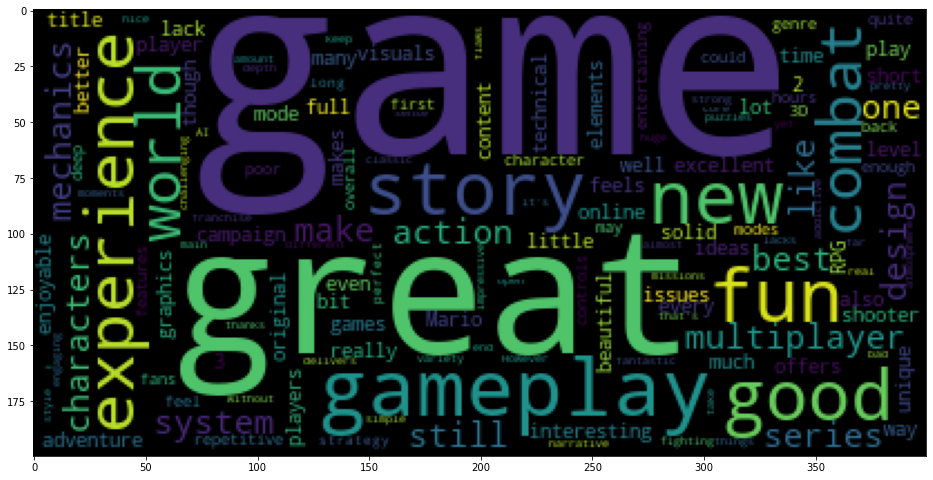

Cluster 4


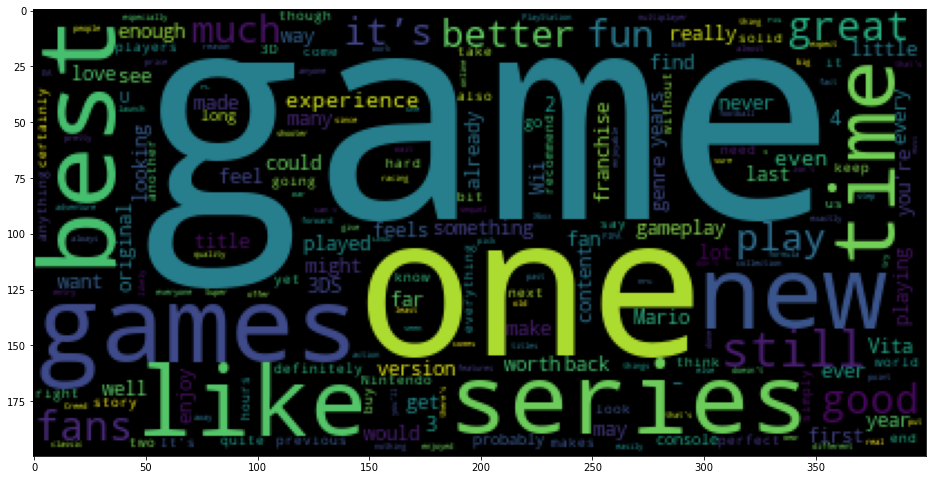

In [5]:
main_df["cluster_label"] = kmeans_labels
file_de.draw_word_clouds_for_clusters(main_df, 5)

In [6]:
silhouette_score(x_train, kmeans_labels)

0.27060607